In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
import seaborn as sns

colors = [(0,0,0)]
colors =[(0,0,0)] +  sns.color_palette("muted", 6)+[(.2,.2,.2)]


outlier_functions = ['control', 'kNN', 'LOF', 'iforest', 'pca', 'kde', 'mahalanobis','random']
color_dict = dict(zip(outlier_functions, colors))

In [4]:

import matplotlib.patches as mpatches
patches = [
    mpatches.Patch(color=colors[0], label='control'),
    mpatches.Patch(color=colors[1], label='kNN'),
    mpatches.Patch(color=colors[2], label='LOF'),
    mpatches.Patch(color=colors[3], label='iforest'),
    mpatches.Patch(color=colors[4], label='pca'),
    mpatches.Patch(color=colors[5], label='kde'),
]

In [5]:
# Load the CSV data
data = pd.read_csv("results/clustering/results_test3.csv")

In [6]:
data

,Dataset,Split_Val,Outlier_Function,Class_Function,Threshold_Val,ParA_Val,ParB_Val,Outliers Removed Pct,Silhouette_score,Calinski_Harabasz_score,Davies_Bouldin_score,V_measure_score,Adjusted_Rand_score,Rand_score,Completeness_score,Homogeneity_score,Elapsed Time
0,covtype_partial_mmNorm,NaN,control,k_means_clustering,0.05,2,Med,0.00000,0.278068,1914.445130,1.821959,0.361527,0.215137,0.794761,0.362249,0.360808,0.000026
1,covtype_partial_mmNorm,NaN,control,gaussian_mixture_clustering,0.05,2,Med,0.00000,0.258363,1753.717789,2.198207,0.380146,0.230325,0.798609,0.381094,0.379202,0.000026
2,covtype_partial_mmNorm,NaN,control,agglomerative_clustering,0.05,2,Med,0.00000,0.349729,2046.959002,1.351225,0.386941,0.220278,0.788414,0.392723,0.381326,0.000026
3,covtype_partial_mmNorm,NaN,control,dbscan_clustering,0.05,2,Med,0.00000,0.478261,796.783633,1.116984,0.380351,0.172839,0.841220,0.296774,0.529452,0.000026
4,covtype_partial_mmNorm,NaN,control,hdbscan_clustering,0.05,2,Med,0.00000,0.579953,1027.229688,0.967151,0.381992,0.174811,0.840662,0.299222,0.528061,0.000026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9444,yeast_mmNorm,NaN,random,k_means_clustering,0.35,2,Med,0.34973,0.165979,177.004703,1.358019,0.263311,0.134834,0.738314,0.241169,0.289931,0.000048
9445,yeast_mmNorm,NaN,random,gaussian_mixture_clustering,0.35,2,Med,0.34973,-0.012032,63.899709,2.357403,0.154913,0.054140,0.674227,0.151265,0.158741,0.000048
9446,yeast_mmNorm,NaN,random,agglomerative_clustering,0.35,2,Med,0.34973,0.144071,155.882981,1.232839,0.252061,0.137496,0.735154,0.235085,0.271680,0.000048
9447,yeast_mmNorm,NaN,random,dbscan_clustering,0.35,2,Med,0.34973,0.555526,47.971862,2.242819,0.046625,0.012365,0.268688,0.276598,0.025458,0.000048


In [7]:


# Call the function with the desired input parameters
outlier_function = 'outlier_function_name'
dataset = 'run_or_walk_normMM_noise_0.1'
split_val = 1000
class_function = 'logistic_regression_classifier'
Threshold_val = 1.8



In [8]:
class_functions = data['Class_Function'].unique()
class_functions_names = [func.replace('_classifier', '') for func in class_functions]



In [9]:
filtered_df = data[data['Dataset'] == dataset]
filtered_df = filtered_df[filtered_df['Class_Function'] == class_function]
unique_values = filtered_df['Outlier_Function'].unique()



In [10]:
datasets = ['covtype_partial_mmNorm', 'covtype_partial_mmNorm_noise_0.1', 'covtype_partial_mmNorm_noise_0.2',
        'eeg-eye-state_normMM', 'eeg-eye-state_normMM_noise_0.1', 'eeg-eye-state_normMM_noise_0.2',
        'yeast_mmNorm', 'yeast_mmNorm_noise_0.1','yeast_mmNorm_noise_0.2',
        'Dry_Bean_mmNorm','Dry_Bean_mmNorm_noise_0.1','Dry_Bean_mmNorm_noise_0.2']

<h3> toggle random</h3>

In [119]:
data['Class_Function'].unique()

array(['k_means_clustering', 'gaussian_mixture_clustering',
       'agglomerative_clustering', 'dbscan_clustering',
       'hdbscan_clustering'], dtype=object)

In [99]:

metric = 'Silhouette_score'


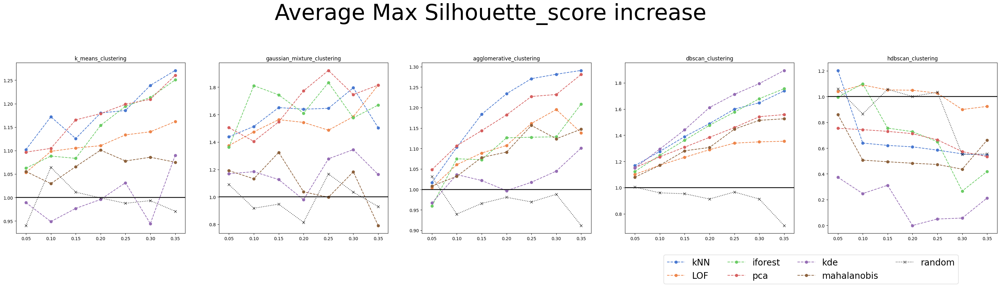

In [100]:


filtered_df =data
fig, axs = plt.subplots(1,len(class_functions), figsize=(40,7))

for i,  class_function in enumerate(class_functions):
    filtered_df2 = filtered_df[filtered_df['Class_Function'] == class_function]
    
    ylim_min = max(-.5, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
    ylim_max =  min(1,filtered_df2[metric].max()) # Dynamic calculation of y-axis limits
    
    control_df = filtered_df2[filtered_df2['Outlier_Function'] == 'control']

    for j,  OR_func in enumerate(outlier_functions):
        if OR_func == 'control':
            continue
        filtered_df3 = filtered_df2[filtered_df2 ['Outlier_Function'] == OR_func]
        
        
        values_arr = []
        
        for k, dataset in enumerate(datasets): 
            # print(f'Plotting for {OR_func}')
            filtered_df4 = filtered_df3[filtered_df3['Dataset'] == dataset]
            
            control_val = control_df[control_df['Dataset'] ==dataset][metric].mean()
            # if OR_func == 'control':
            #     accuracy_values = or_func_df[metric]
            #     avg_accuracy = accuracy_values.mean()
            #     axs[i][j].axhline(y=avg_accuracy, color='black', label='Control Accuracy')
            #     continue

            
            contam_pct = filtered_df4['Outliers Removed Pct'].apply(lambda x: round(x, 2))
            # if len(contam_pct) !=35:
            #     continue
            accuracy_values = filtered_df4[metric]/control_val
            max_accuracy = accuracy_values.groupby(contam_pct).max() 
            if len(max_accuracy) <7:
                continue
            values_arr.append(max_accuracy.to_list())

        mean_values = np.mean(values_arr, axis=0)  # Calculate the mean values across all datasets
        
        if OR_func == 'random':
            axs[i].plot(contam_pct.unique(), mean_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)

        else:
            axs[i].plot(contam_pct.unique(), mean_values, marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i].set_title(f"{class_function}")
        # axs[i].set_ylim(ylim_min, ylim_max)
        axs[i].set_xlim(0.03, 0.37)
        axs[i].axhline(y=1, color='black')

    

fig.suptitle(f'Average Max {metric} increase', fontsize=50, y=1.15)

plt.legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), ncol=4, fontsize=20)

# Show the plot
plt.show()

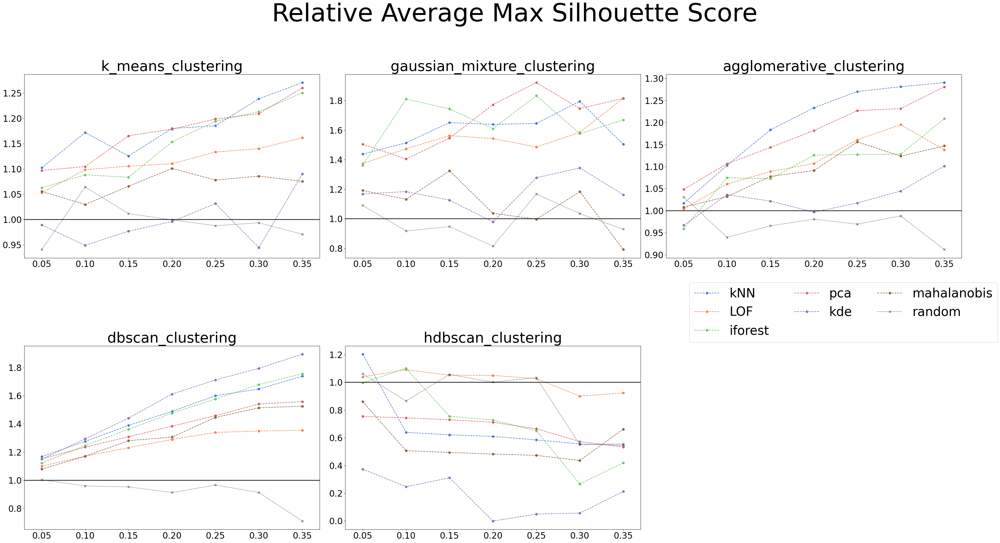

In [117]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have defined your data and variables before this point

fig, axs = plt.subplots(2, 3, figsize=(40, 20))
plt.subplots_adjust(wspace=0.3)
for i, class_function in enumerate(class_functions):
    filtered_df2 = filtered_df[filtered_df['Class_Function'] == class_function]
    
    ylim_min = max(-0.5, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
    ylim_max = min(1, filtered_df2[metric].max()) # Dynamic calculation of y-axis limits
    
    control_df = filtered_df2[filtered_df2['Outlier_Function'] == 'control']

    for j, OR_func in enumerate(outlier_functions):
        if OR_func == 'control':
            continue
        filtered_df3 = filtered_df2[filtered_df2['Outlier_Function'] == OR_func]
        
        values_arr = []
        
        for k, dataset in enumerate(datasets): 
            filtered_df4 = filtered_df3[filtered_df3['Dataset'] == dataset]
            
            control_val = control_df[control_df['Dataset'] == dataset][metric].mean()
            
            contam_pct = filtered_df4['Outliers Removed Pct'].apply(lambda x: round(x, 2))
            accuracy_values = filtered_df4[metric] / control_val
            max_accuracy = accuracy_values.groupby(contam_pct).max() 
            if len(max_accuracy) < 7:
                continue
            values_arr.append(max_accuracy.to_list())

        mean_values = np.mean(values_arr, axis=0)  # Calculate the mean values across all datasets
        
        if OR_func == 'random':
            axs[int(i/3)][i%3].plot(contam_pct.unique(), mean_values, marker='x', linestyle=':', color=color_dict[OR_func], label=OR_func)
        else:
            axs[int(i/3)][i%3].plot(contam_pct.unique(), mean_values, marker='o', linestyle='--', color=color_dict[OR_func], label=OR_func)  # Add label for each OR_func
            
        axs[int(i/3)][i%3].set_title(f"{class_function}", fontsize=40)
        axs[int(i/3)][i%3].set_xlim(0.03, 0.37)
        # axs[int(i/3)][i%3].set_ylim(ylim_min, ylim_max)
        axs[int(i/3)][i%3].axhline(y=1, color='black')
                # Change the font of the x-axis ticks
        axs[int(i/3)][i%3].tick_params( axis='both', which='major', labelsize=24)

# Hiding the last subplot in the first row
axs[1, 2].axis('off')

fig.suptitle(f'Relative Average Max Silhouette Score', fontsize=70, y=1.05)

# Adding legend for the first row
axs[0, 2].legend(loc='upper center', bbox_to_anchor=(0.6, -0.1), ncol=3, fontsize=35)

# Show the plot
plt.tight_layout()
plt.show()


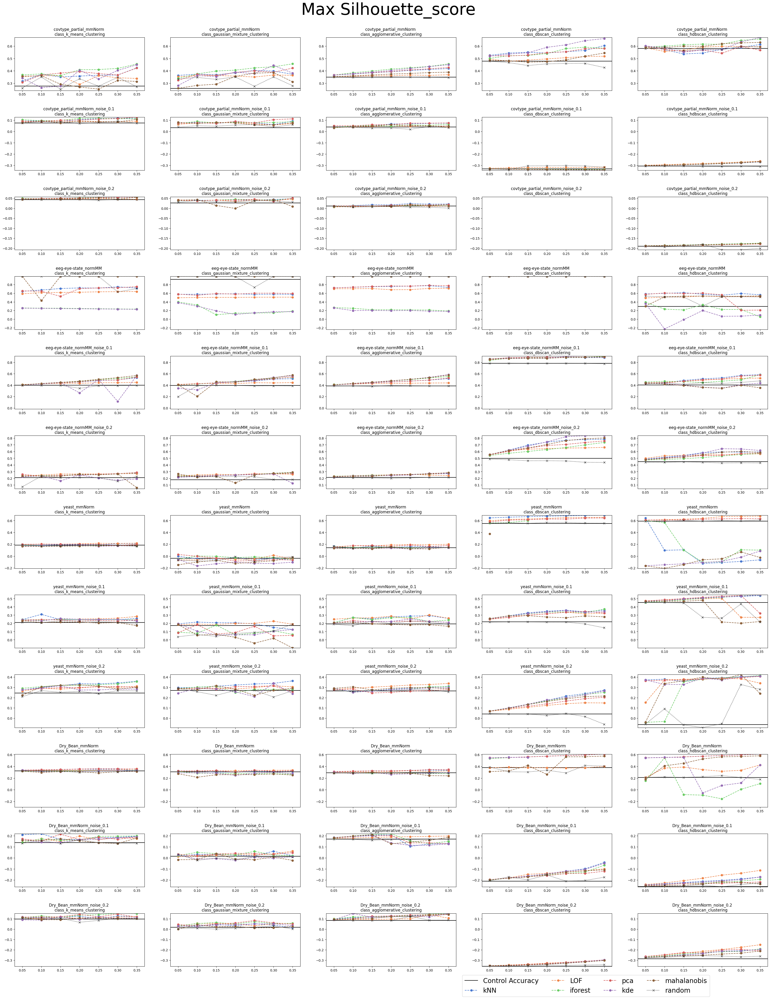

In [102]:


filtered_df =data
fig, axs = plt.subplots( len(datasets),len(class_functions), figsize=(40,50))
plt.subplots_adjust(hspace=0.5, top=.99, bottom=0.2, left=0.1, right=0.9)

for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    ylim_min = max(-.5, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
    ylim_max =  min(1,filtered_df2[metric].max()) # Dynamic calculation of y-axis limits
    
    for j, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='black', label='Control Accuracy')
                continue
            elif OR_func == 'random':
                contam_pct = or_func_df['Outliers Removed Pct']
                rMSE_values = or_func_df[metric]
                axs[i][j].plot(contam_pct, rMSE_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue
            
            contam_pct = or_func_df['Outliers Removed Pct'].apply(lambda x: round(x, 2))
            
            accuracy_values = or_func_df[metric]
            max_accuracy = accuracy_values.groupby(contam_pct).max()  # Get the maximum value at each threshold
            
            
            

            axs[i][j].plot(contam_pct.unique(), max_accuracy, marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        axs[i][j].set_ylim(ylim_min, ylim_max)
        axs[i][j].set_xlim(0.03, 0.37)
    

fig.suptitle(f'Max {metric} ', fontsize=50, y=1.02)

plt.legend(loc='upper center', bbox_to_anchor=(-0.4, -0.1), ncol=4, fontsize=20)

# Show the plot
plt.show()

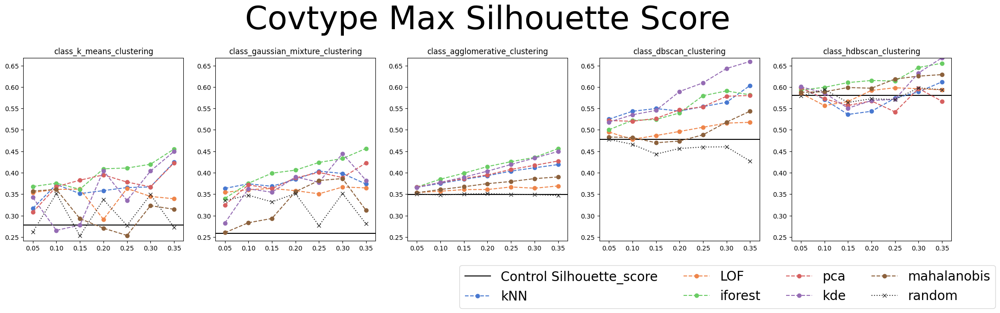

In [103]:


filtered_df =data
fig, axs = plt.subplots( 1,len(class_functions), figsize=(25,5))
plt.subplots_adjust(hspace=0.5, top=.99, bottom=0.2, left=0.1, right=0.9)

dataset =datasets[0]
i=0
filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]

ylim_min = max(-.5, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
ylim_max =  min(1,filtered_df2[metric].max()) # Dynamic calculation of y-axis limits

for j, class_function in enumerate(class_functions):
    filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
    for k, OR_func in enumerate(outlier_functions):
        # print(f'Plotting for {OR_func}')
        or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
        if OR_func == 'control':
            accuracy_values = or_func_df[metric]
            avg_accuracy = accuracy_values.mean()
            axs[j].axhline(y=avg_accuracy, color='black', label=f'Control {metric}')
            continue
        elif OR_func == 'random':
            contam_pct = or_func_df['Outliers Removed Pct']
            rMSE_values = or_func_df[metric]
            axs[j].plot(contam_pct, rMSE_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
            continue
        
        contam_pct = or_func_df['Outliers Removed Pct'].apply(lambda x: round(x, 2))
        
        accuracy_values = or_func_df[metric]
        max_accuracy = accuracy_values.groupby(contam_pct).max()  # Get the maximum value at each threshold
        
        
        

        axs[j].plot(contam_pct.unique(), max_accuracy, marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
        
    axs[j].set_title(f"class_{class_function}")
    axs[j].set_ylim(ylim_min, ylim_max)
    axs[j].set_xlim(0.03, 0.37)
    

fig.suptitle(f'Covtype Max Silhouette Score', fontsize=50, y=1.22)

plt.legend(loc='upper center', bbox_to_anchor=(-0.4, -0.1), ncol=4, fontsize=20)

# Show the plot
plt.show()

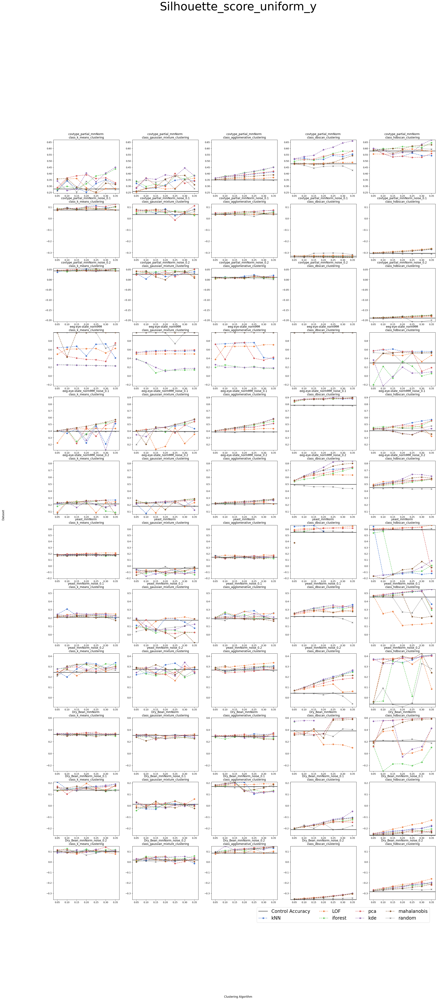

In [104]:
# Create a figure and subplots
filtered_df = data[(data['ParA_Val'] == 4) | (data['Outlier_Function'].isin(['kde', 'mahalanobis','random' ,'control']))]

fig, axs = plt.subplots( len(datasets),len(class_functions), figsize=(30,60))

for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    ylim_min = max(-1, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
    ylim_max =  min(1,filtered_df2[metric].max()) # Dynamic calculation of y-axis limits
    for j, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]

        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='black',label='Control Accuracy')
                continue
            elif OR_func == 'random':
                contam_pct = or_func_df['Outliers Removed Pct']
                rMSE_values = or_func_df[metric]
                axs[i][j].plot(contam_pct, rMSE_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue
            
            contam_pct = or_func_df['Outliers Removed Pct']
            accuracy_values = or_func_df[metric]
            
            axs[i][j].plot(contam_pct, accuracy_values, marker='o',  linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        axs[i][j].set_ylim(ylim_min, ylim_max)
        axs[i][j].set_xlim(0.03, 0.37)
        
    
fig.supylabel('Dataset')

fig.supxlabel('Clustering Algorithm')  
fig.suptitle(f'{metric}_uniform_y', fontsize=50, y=1.02)


plt.legend(loc='upper center', bbox_to_anchor=(-0.4, -0.1), ncol=4, fontsize=20)
# Show the plot
plt.show()

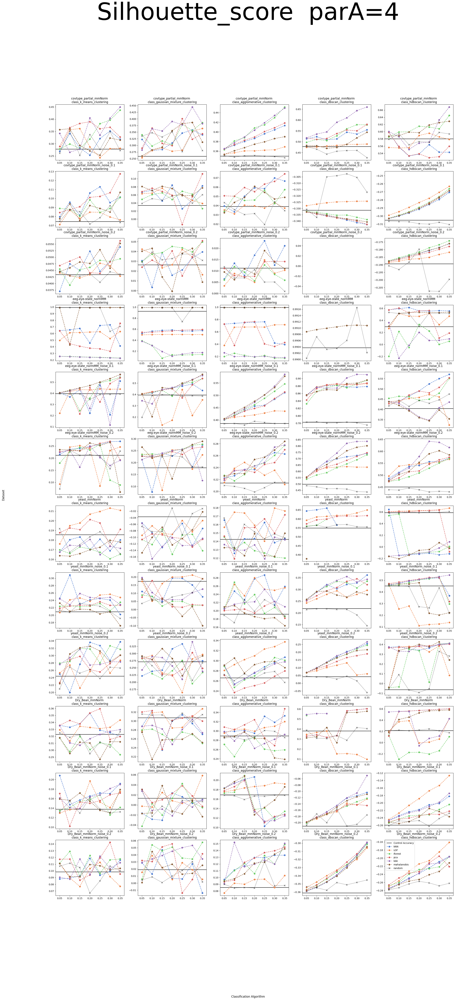

In [105]:
# Create a figure and subplots
fileterd_df =data
parA=4
filtered_df = data[(data['ParA_Val'] == parA) | (data['Outlier_Function'].isin(['kde', 'mahalanobis','random', 'control']))]
fig, axs = plt.subplots( len(datasets),len(class_functions), figsize=(30,60))

for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    for j, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='black', label='Control Accuracy')
                continue
            elif OR_func == 'random':
                contam_pct = or_func_df['Outliers Removed Pct']
                rMSE_values = or_func_df[metric]
                axs[i][j].plot(contam_pct, rMSE_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue
            
            contam_pct = or_func_df['Outliers Removed Pct']
            accuracy_values = or_func_df[metric]
            axs[i][j].plot(contam_pct, accuracy_values, marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        axs[i][j].set_xlim(0.03, 0.37)
    
fig.supylabel('Dataset')

fig.supxlabel('Classification Algorithm')  
plt.legend()

fig.suptitle(f'{metric}  parA={parA}', fontsize=100)


# Show the plot
plt.show()

<h3> max value across thresholds</h3>

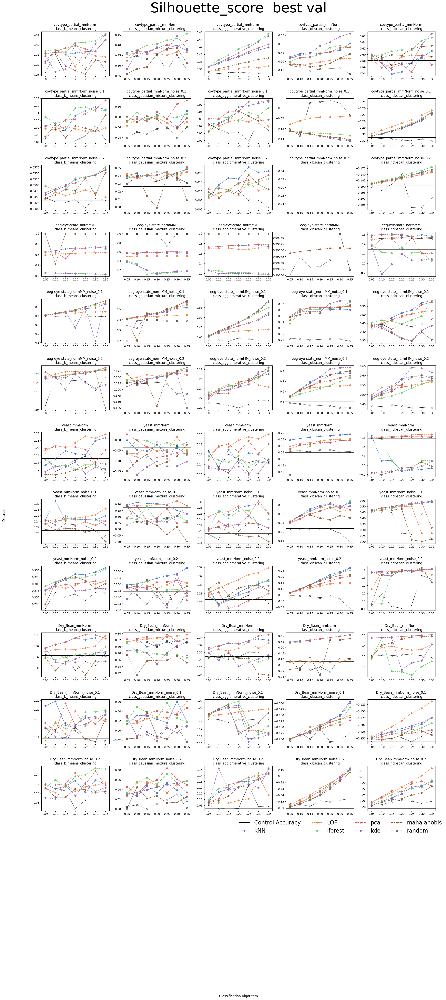

In [106]:
filtered_df =data

fig, axs = plt.subplots( len(datasets),len(class_functions), figsize=(25,50))
plt.subplots_adjust(hspace=0.5, top=.99, bottom=0.2, left=0.1, right=0.9)
for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    for j, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='black', label='Control Accuracy')
                continue
            elif OR_func == 'random':
                contam_pct = or_func_df['Outliers Removed Pct']
                rMSE_values = or_func_df[metric]
                axs[i][j].plot(contam_pct, rMSE_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue
            
            contam_pct = or_func_df['Outliers Removed Pct'].apply(lambda x: round(x, 2))
            
            accuracy_values = or_func_df[metric]
            max_accuracy = accuracy_values.groupby(contam_pct).max()  # Get the maximum value at each threshold
            

            axs[i][j].plot(contam_pct.unique(), max_accuracy, marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        
        axs[i][j].set_xlim(0.03, 0.37)
    
fig.supylabel('Dataset')

fig.supxlabel('Classification Algorithm')  
fig.suptitle(f'{metric}  best val', fontsize=50, y=1.02)


plt.legend(loc='upper center', bbox_to_anchor=(-0.4, -0.1), ncol=4, fontsize=20)

# Show the plot
plt.show()

oulieer x Class_Function

In [107]:
# # Create a figure and subplots\
# filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'random') | (filtered_df['Outlier_Function'] == 'control')]
# fig, axs = plt.subplots( len(outlier_functions)-1, len(class_functions),figsize=(60, 30))


# control_df = filtered_df[filtered_df['Outlier_Function'] == 'control']
# for i, outlier_function in enumerate(outlier_functions):
#     filtered_df2 = filtered_df[filtered_df['Outlier_Function'] == outlier_function ]
#     if outlier_function == 'control':
#         continue
#     for j, class_function in enumerate(class_functions):
#         filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
#         control_df2 = control_df[control_df['Class_Function'] == class_function]
#         for k, dataset in enumerate(datasets):
#             # print(f'Plotting for {OR_func}')
#             or_func_df = filtered_df3[filtered_df3['Dataset'] == dataset]
#             control_df3 = control_df2[control_df2['Dataset'] == dataset]

            
#             control = np.mean(control_df3[metric])
            
#             contam_pct = or_func_df['Outliers Removed Pct']
#             acccuracy_values = or_func_df[metric]/control
#             axs[i][j].plot(contam_pct, acccuracy_values,marker='o',color =color_dict[outlier_function], label=dataset)  # Add label for each OR_func
            
#         axs[i][j].set_title(f"{outlier_function} \nreg_{class_function}")
#         axs[i][j].set_yscale('log')  # Set y-axis to logarithmic scale

# fig.supylabel('splitval')

# fig.supxlabel('Classification Algorithm')  
# plt.legend()

# # Show the plot
# plt.show()

bar chart

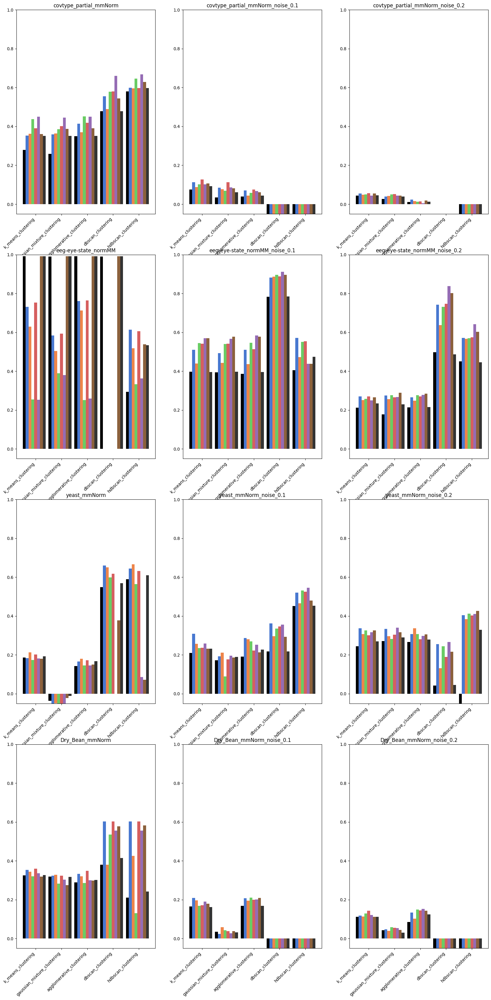

In [108]:
# Grouped bar chart
# Create a figure and subplots
filtered_df = data[(data['ParA_Val'] == 4) | (data['Outlier_Function'] == 'kde') |(data['Outlier_Function'] == 'mahalanobis') |(filtered_df['Outlier_Function'] == 'random') | (data['Outlier_Function'] == 'control')]


filtered_df = filtered_df[filtered_df['Class_Function'] != "polynomial_regression"]
class_functions = filtered_df['Class_Function'].unique()



fig, axs = plt.subplots( int(len(datasets)/3),3, figsize=(20,40))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(class_functions)) *1.8

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/3)
    if dataset.endswith('0.1'):
        j=1
    elif dataset.endswith('0.2'):
        j=2
    else:
        j=0 
        
        
        
    # Loop through each class_function
    for b, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].max()
            
            # Plot the bar for each outlier function
            axs[i][j].bar(x[b] + (c * bar_width), rMSE_mean, width=bar_width, label=OR_func,color=color_dict[OR_func])
            
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)
    axs[i][j].set_ylim(-.05,1)
    axs[i][j].set_xticklabels(class_functions_names, rotation=45, ha='right')

plt.show()

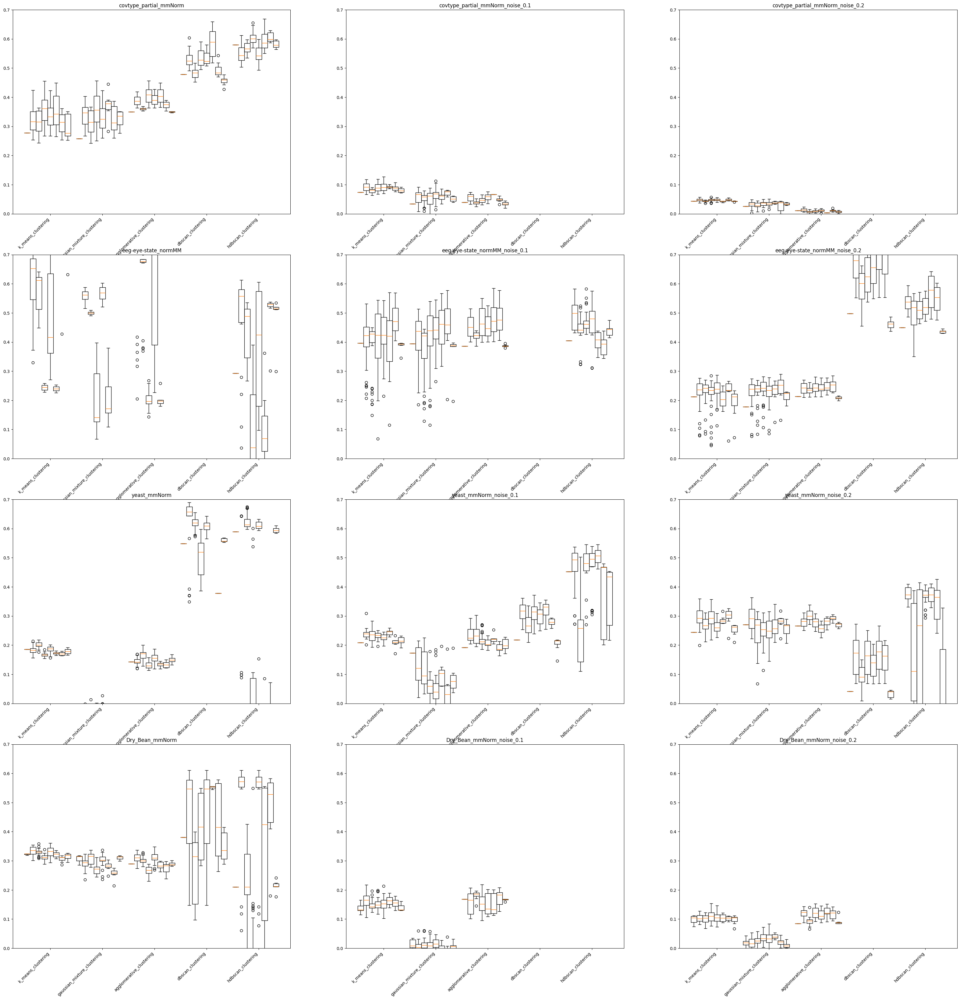

In [109]:
filtered_df = data[(data['ParA_Val'] == 4) | (data['Outlier_Function'] == 'kde') | (data['Outlier_Function'] == 'mahalanobis') |(filtered_df['Outlier_Function'] == 'random') |  (data['Outlier_Function'] == 'control')]
filtered_df = data

fig, axs = plt.subplots( int(len(datasets)/3),3, figsize=(40,40))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(class_functions)) *1.8

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/3)
    if dataset.endswith('0.1'):
        j=1
    elif dataset.endswith('0.2'):
        j=2
    else:
        j=0 
        
        
        
    # Loop through each class_function
    for b, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].mean()
            
            # Plot the bar for each outlier function
            axs[i][j].boxplot(or_func_df[metric], positions=[x[b] + (c * bar_width)], widths=bar_width)
            
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)
    axs[i][j].set_ylim(0, .7)
    axs[i][j].set_xticklabels(class_functions_names, rotation=45, ha='right')

plt.show()

bar chart pct of control

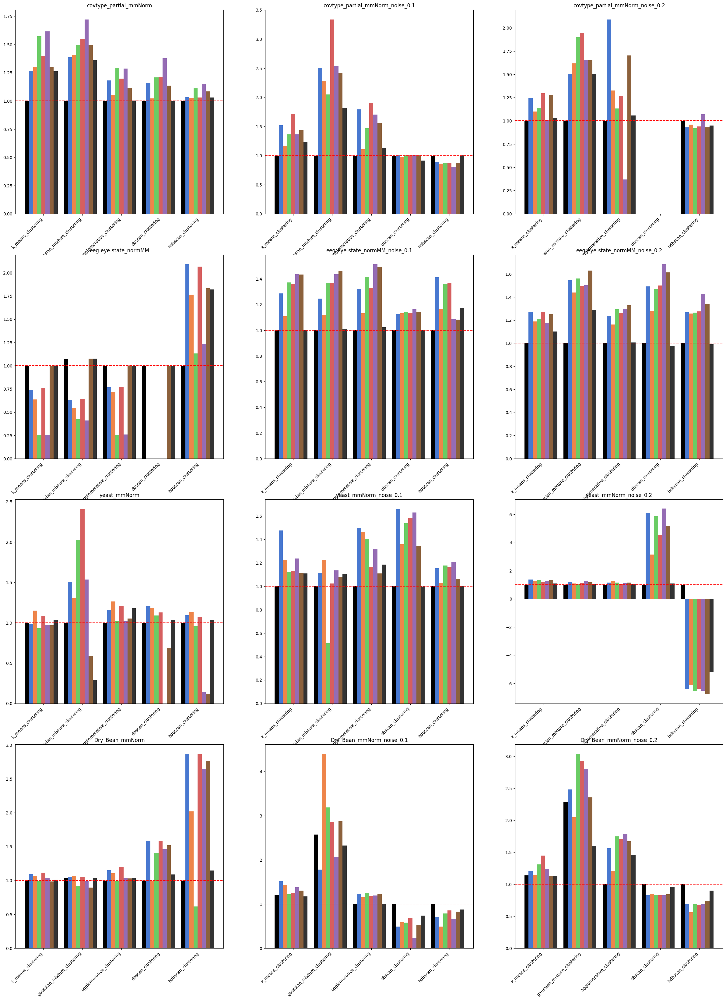

In [110]:
# Grouped bar chart
# Create a figure and subplots
filtered_df = data[(data['ParA_Val'] == 4) | (data['Outlier_Function'] == 'kde') | (data['Outlier_Function'] == 'mahalanobis') |(filtered_df['Outlier_Function'] == 'random') |  (data['Outlier_Function'] == 'control')]


class_functions = filtered_df['Class_Function'].unique()



fig, axs = plt.subplots( int(len(datasets)/3),3, figsize=(30, 40))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(class_functions)) *1.9

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/3)
    if dataset.endswith('0.1'):
        j=1
    elif dataset.endswith('0.2'):
        j=2
    else:
        j=0 
        
        
        
    # Loop through each class_function
    for b, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        control = filtered_df3[filtered_df3['Outlier_Function'] == 'control'][metric].mean()
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].max()
            
            rMSE_mean_pct = rMSE_mean/control
            # Plot the bar for each outlier function
            axs[i][j].bar(x[b] + (c * bar_width), rMSE_mean_pct, width=bar_width, label=OR_func,color=color_dict[OR_func])
    
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)
    # axs[i][j].set_ylim(0, 1.6)
    axs[i][j].set_xticklabels(class_functions_names, rotation=45, ha='right')
    
    # Draw a horizontal line at 1.0 dashed
    axs[i][j].axhline(y=1.0, color='r', linestyle='--')


# Show the plot
plt.show()

In [111]:
data

,Dataset,Split_Val,Outlier_Function,Class_Function,Threshold_Val,ParA_Val,ParB_Val,Outliers Removed Pct,Silhouette_score,Calinski_Harabasz_score,Davies_Bouldin_score,V_measure_score,Adjusted_Rand_score,Rand_score,Completeness_score,Homogeneity_score,Elapsed Time
0,covtype_partial_mmNorm,NaN,control,k_means_clustering,0.05,2,Med,0.00000,0.278068,1914.445130,1.821959,0.361527,0.215137,0.794761,0.362249,0.360808,0.000026
1,covtype_partial_mmNorm,NaN,control,gaussian_mixture_clustering,0.05,2,Med,0.00000,0.258363,1753.717789,2.198207,0.380146,0.230325,0.798609,0.381094,0.379202,0.000026
2,covtype_partial_mmNorm,NaN,control,agglomerative_clustering,0.05,2,Med,0.00000,0.349729,2046.959002,1.351225,0.386941,0.220278,0.788414,0.392723,0.381326,0.000026
3,covtype_partial_mmNorm,NaN,control,dbscan_clustering,0.05,2,Med,0.00000,0.478261,796.783633,1.116984,0.380351,0.172839,0.841220,0.296774,0.529452,0.000026
4,covtype_partial_mmNorm,NaN,control,hdbscan_clustering,0.05,2,Med,0.00000,0.579953,1027.229688,0.967151,0.381992,0.174811,0.840662,0.299222,0.528061,0.000026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9444,yeast_mmNorm,NaN,random,k_means_clustering,0.35,2,Med,0.34973,0.165979,177.004703,1.358019,0.263311,0.134834,0.738314,0.241169,0.289931,0.000048
9445,yeast_mmNorm,NaN,random,gaussian_mixture_clustering,0.35,2,Med,0.34973,-0.012032,63.899709,2.357403,0.154913,0.054140,0.674227,0.151265,0.158741,0.000048
9446,yeast_mmNorm,NaN,random,agglomerative_clustering,0.35,2,Med,0.34973,0.144071,155.882981,1.232839,0.252061,0.137496,0.735154,0.235085,0.271680,0.000048
9447,yeast_mmNorm,NaN,random,dbscan_clustering,0.35,2,Med,0.34973,0.555526,47.971862,2.242819,0.046625,0.012365,0.268688,0.276598,0.025458,0.000048


In [112]:
class_functions

array(['k_means_clustering', 'gaussian_mixture_clustering',
       'agglomerative_clustering', 'dbscan_clustering',
       'hdbscan_clustering'], dtype=object)

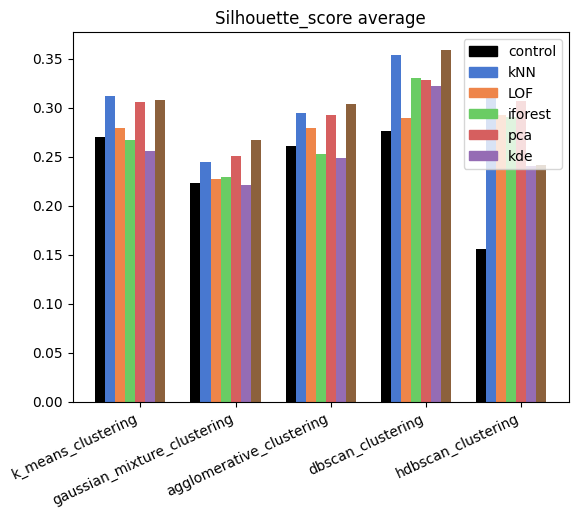

In [113]:


# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(class_functions)) *1.9


for b, class_function in enumerate(class_functions):
    filtered_df2 = data[data['Class_Function'] == class_function]
    control = filtered_df2[filtered_df2['Outlier_Function'] == 'control']
    # Loop through each outlier function
    for c, OR_func in enumerate(outlier_functions):
        # if OR_func == 'control' and :
        #     continue
        
        filtered_df3 = filtered_df2[filtered_df2['Outlier_Function'] == OR_func]
        pcts=[]
        for a, dataset in enumerate(datasets):
            
            df = filtered_df3[filtered_df3['Dataset'] == dataset]
            if df.empty:
                continue
            control_val = control[control['Dataset'] == dataset][metric].mean()

            rMSE_mean = df[metric].max()

            rMSE_mean_pct = rMSE_mean
            pcts.append(rMSE_mean_pct)

        
        rMSE_mean_pct = np.mean(pcts)
        # Plot the bar for each outlier function
        # if (OR_func == 'control') or OR_func == 'random':
        #     continue
        if (OR_func == 'random') :
            continue
        # if (OR_func == 'control') :
        #     plt.bar(x[b] + (c * bar_width), 1.0, width=bar_width, label=OR_func,color=color_dict[OR_func])

        #     continue
        plt.bar(x[b] + (c * bar_width), rMSE_mean_pct, width=bar_width, label=OR_func,color=color_dict[OR_func])

plt.title(f'{metric} average')
plt.xticks(x + (len(outlier_functions) * bar_width) / 2, class_functions, rotation=25, ha='right')  # Set the x-tick labels with rotation



# Add a legend
plt.legend(handles = patches)

# Show the plot
plt.show()

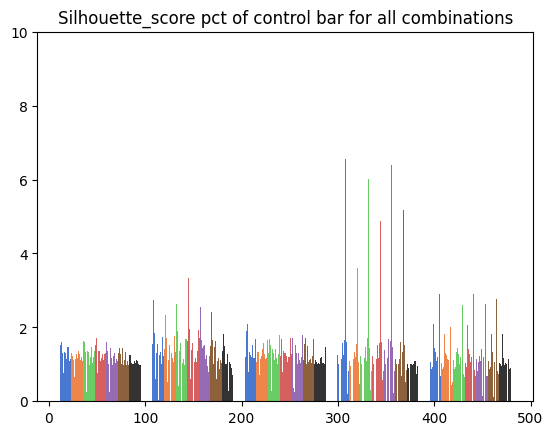

In [114]:
# Grouped bar chart
# Create a figure and subplots
# filtered_df = data[(data['ParA_Val'] == 4) | (data['Outlier_Function'] == 'kde') | (data['Outlier_Function'] == 'mahalanobis') |(filtered_df['Outlier_Function'] == 'random') |  (data['Outlier_Function'] == 'control')]

filtered_df=data
control_df = data[data['Outlier_Function'] == 'control']

class_functions = filtered_df['Class_Function'].unique()

# Set the x positions of the bars
x = np.arange(len(class_functions)*len(outlier_functions)*len(datasets) + len(outlier_functions)*len(datasets) + len(datasets))
bar_width = 1

plt.size = (70,60)
# Loop through each class function
fig, ax = plt.subplots()

for a, class_function in enumerate(class_functions):
    # Loop through each outlier function
    for c, OR_func in enumerate(outlier_functions):
        if OR_func == 'control':
            continue
        # Loop through each dataset
        for b, dataset in enumerate(datasets):
            
            filtered_df2 = filtered_df[(filtered_df['Class_Function'] == class_function) & 
                            (filtered_df['Dataset'] == dataset) & 
                            (filtered_df['Outlier_Function'] == OR_func)]
            control_df2 = control_df[(control_df['Class_Function'] == class_function) & 
                            (control_df['Dataset'] == dataset)]
            control_val = control_df2[control_df2['Dataset'] == dataset][metric].max()

            rMSE_mean = filtered_df2[metric].max()
            rMSE_mean_pct = rMSE_mean/control_val
            # Plot the bar for each outlier function
            ax.bar(x[a*len(outlier_functions)*len(datasets) + c*len(datasets) + b], 
                rMSE_mean_pct, 
                width=bar_width, 
                label=OR_func, 
                color=color_dict[OR_func])
ax.set_ylim(0, 10)# 
plt.title(f'{metric} pct of control bar for all combinations')
plt.show()






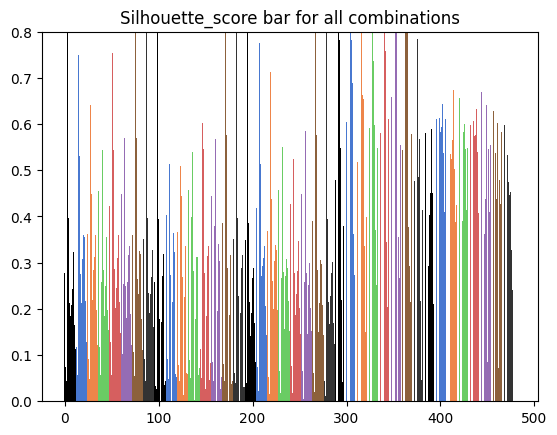

In [115]:
# Grouped bar chart
# Create a figure and subplots
# filtered_df = data[(data['ParA_Val'] == 4) | (data['Outlier_Function'] == 'kde') | (data['Outlier_Function'] == 'mahalanobis') |(filtered_df['Outlier_Function'] == 'random') |  (data['Outlier_Function'] == 'control')]

filtered_df=data
control_df = data[data['Outlier_Function'] == 'control']

class_functions = filtered_df['Class_Function'].unique()

# Set the x positions of the bars
x = np.arange(len(class_functions)*len(outlier_functions)*len(datasets) + len(outlier_functions)*len(datasets) + len(datasets))
bar_width = 1

plt.size = (70,60)
# Loop through each class function
fig, ax = plt.subplots()

for a, class_function in enumerate(class_functions):
    # Loop through each outlier function
    for c, OR_func in enumerate(outlier_functions):

        # Loop through each dataset
        for b, dataset in enumerate(datasets):
            
            filtered_df2 = filtered_df[(filtered_df['Class_Function'] == class_function) & 
                            (filtered_df['Dataset'] == dataset) & 
                            (filtered_df['Outlier_Function'] == OR_func)]

            rMSE_mean = filtered_df2[metric].max()
            rMSE_mean_pct = rMSE_mean
            # Plot the bar for each outlier function
            ax.bar(x[a*len(outlier_functions)*len(datasets) + c*len(datasets) + b], 
                rMSE_mean_pct, 
                width=bar_width, 
                label=OR_func, 
                color=color_dict[OR_func])
ax.set_ylim(0, .8)# 
plt.title(f'{metric} bar for all combinations')
plt.show()


In [116]:

# Create an empty DataFrame
df_table = pd.DataFrame(columns=['clustering algorithm', 'outlier detection', 'metric'])

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(class_functions)) * 1.9

for b, class_function in enumerate(class_functions):
    filtered_df2 = data[data['Class_Function'] == class_function]
    control = filtered_df2[filtered_df2['Outlier_Function'] == 'control']
    # Loop through each outlier function
    for c, OR_func in enumerate(outlier_functions):
        if OR_func == 'control' and OR_func == 'eeg-eye-state_normMM':
            continue
        
        filtered_df3 = filtered_df2[filtered_df2['Outlier_Function'] == OR_func]
        pcts = []
        for a, dataset in enumerate(datasets):
            df = filtered_df3[filtered_df3['Dataset'] == dataset]
            control_val = control[control['Dataset'] == dataset][metric].max()

            SS_mean = df['Silhouette_score'].max()
            CH_mean = df['Calinski_Harabasz_score'].max()
            DB_mean = df['Davies_Bouldin_score'].max()
            V_mean = df['V_measure_score'].max()
            AR_mean = df['Adjusted_Rand_score'].max()
            R_mean = df['Rand_score'].max()
            CS_mean = df['Completeness_score'].max()
            HS_mean = df['Homogeneity_score'].max()
            CH_mean = df['Elapsed Time'].mean()
            


            rMSE_mean_pct = rMSE_mean / control_val
            pcts.append(rMSE_mean_pct)

        rMSE_mean_pct = np.mean(pcts)
        
        # Append the values to the DataFrame
        if OR_func != 'control' and OR_func != 'eeg-eye-state_normMM':
            df_table.loc[len(df_table)] ={'clustering algorithm': class_function,
                                    'outlier detection': OR_func,
                                    'metric': control_val}
        df_table.loc[len(df_table)] ={'clustering algorithm': class_function,
                                    'outlier detection': OR_func,
                                    'metric': rMSE_mean_pct}

# Show the table
print(df_table)

    

   clustering algorithm outlier detection    metric
0    k_means_clustering           control -1.730323
1    k_means_clustering               kNN  0.112335
2    k_means_clustering               kNN -1.730323
3    k_means_clustering               LOF  0.112335
4    k_means_clustering               LOF -1.730323
..                  ...               ...       ...
70   hdbscan_clustering               kde  0.284732
71   hdbscan_clustering       mahalanobis -0.286318
72   hdbscan_clustering       mahalanobis  0.284732
73   hdbscan_clustering            random -0.286318
74   hdbscan_clustering            random  0.284732

[75 rows x 3 columns]
